# Detecting Cancer in the CAMELYON16 dataset

## Train the Pretrained InceptionV3 Model on Multi Scale Data Based on Patches at Level 3


In this notebook, a pretrained model is used to train the [preprocessed data](https://storage.googleapis.com/augmented_patches/multiscale_level3to5/augmented_data.zip) from notebook *Preprocessing (MultiScale).ipynb*. The structure is similar to *1.1 single-scale Pretrain Level 2.ipynb*. However this time I used Functional API to build model since we have multiple inputs.

To solve the problem of having small amount of data, I applied several data augmentation method including rotation, flip, changing saturation, hue, contrast and brightness. And I also randomly sample from the data to deal with imbalanced dataset.

The model is trained on GPU offered by [Google Colab](https://colab.research.google.com) and each epoch is saved on the google drive in case of any system break down. Model weights that achieves highest validation AUC is used to evaluate on the validation and test data.

At the end of the notebook, I showed three examples of prediction on the test slides. To make inference, I implemented similar method as on the train set, by sliding a window across the slide and predict for each patch. After that, a heatmap on the slide is generated where patches that predicte positive is marked red.

In [ ]:
# Install the OpenSlide C library and Python bindings
# After installing these libraries, use `Runtime -> restart and run all` on the menu
!apt-get install openslide-tools
!pip install openslide-python

Reading package lists... Done
Building dependency tree       
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from openslide import open_slide, __library_version__ as openslide_version
import time
import os
import random
import pathlib, shutil
from PIL import Image
from skimage.color import rgb2gray
from google.colab import drive
import keras
import sklearn
from sklearn.metrics import roc_curve, confusion_matrix, plot_confusion_matrix
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.layers import Dense, Flatten, Input, Convolution2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.4.1


In [ ]:
from google.colab import auth
auth.authenticate_user()
project_id = 'storied-smile-311319'
!gcloud config set project {project_id}
!gsutil ls

Updated property [core/project].
Caught CTRL-C (signal 2) - exiting
^C


In [ ]:
# Mount drive
drive.mount('/gdrive')
drive_root = '/gdrive/My Drive/'

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


## Preprocessing

### Separate train, validation and test

The following list records number of all the slides in the data [folder](https://drive.google.com/drive/folders/1rwWL8zU9v0M27BtQKI52bF6bVLW82RL5?usp=sharing). There are 21 tumor slide samples in the data.

In [ ]:
numbers = ['001', '002', '005', '012', '016', '019', '023', '031', '035', '057', '059', 
          '064', '075', '078', '081', '084', '091', '094', '096', '101', '110']
train_slides = numbers[:13]
val_slides = numbers[13:17]
test_slides = numbers[17:]

In [ ]:
# read region from the slide.
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

# detect gray region
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return list(zip(indices[0], indices[1]))

### Download Data

In [ ]:
# download the data from given url to target path if there is no previous file exists.
def download_if_missing(url, target, extract=True):
  if os.path.exists(target):
    return target
  return tf.keras.utils.get_file(target, origin=url, extract=extract)

In [ ]:
def random_display(df, n):
    for i in range(n):
        idx = random.choice(df.index)
        for column in df.columns[:-1]:
            print(column)
            path = df.loc[idx, column]
            img = tf.io.read_file(path)  # read
            img = tf.image.decode_jpeg(img, channels=3)  # decode
            plt.imshow(img) # plot the image
            plt.show()
        print('label: ', df.loc[idx, 'label'])
        print()

In [ ]:
colab_root = "/content/"

In [ ]:
train_df_path = os.path.join(colab_root, "train_df.csv")
download_if_missing("https://storage.googleapis.com/augmented_patches/multiscale_level3to5/train_df.csv", 
                    train_df_path)

'/content/train_df.csv'

In [ ]:
val_df_path = os.path.join(colab_root, "val_df.csv")
download_if_missing("https://storage.googleapis.com/augmented_patches/multiscale_level3to5/val_df.csv", 
                    val_df_path)

'/content/val_df.csv'

In [ ]:
test_df_path = os.path.join(colab_root, "test_df.csv")
download_if_missing("https://storage.googleapis.com/augmented_patches/multiscale_level3to5/test_df.csv", 
                    test_df_path)

'/content/test_df.csv'

In [ ]:
data_zip_path = os.path.join(colab_root, "augmented_data.zip")
download_if_missing("https://storage.googleapis.com/augmented_patches/multiscale_level3to5/augmented_data.zip", 
                    data_zip_path)

'/content/augmented_data.zip'

In [ ]:
data_root = os.path.join(colab_root, 'data/')
!unzip -q $data_zip_path -d $data_root

In [ ]:
!du -sh $data_root

5.6G	/content/data/


In [ ]:
train_df = pd.read_csv(train_df_path, index_col=0)
val_df = pd.read_csv(val_df_path, index_col=0)
test_df = pd.read_csv(test_df_path, index_col=0)

### Display Data

#### Dataframe

Print some part of the dataframes to see how the data is orgranized in dataframes. Each row represents a patch on the slide image. The dataframe have four columns, including paths of its context patch at level 3, 4, 5 and its corresponding label.


In [ ]:
train_df.head()

,image_level3,image_level4,image_level5,label
0,/content/data/tumor_001/3/0_0.jpg,/content/data/tumor_001/4/-149_-149.jpg,/content/data/tumor_001/5/-448_-448.jpg,0
1,/content/data/tumor_001/3/128_0.jpg,/content/data/tumor_001/4/-21_-149.jpg,/content/data/tumor_001/5/-320_-448.jpg,0
2,/content/data/tumor_001/3/256_0.jpg,/content/data/tumor_001/4/107_-149.jpg,/content/data/tumor_001/5/-192_-448.jpg,0
3,/content/data/tumor_001/3/384_0.jpg,/content/data/tumor_001/4/235_-149.jpg,/content/data/tumor_001/5/-64_-448.jpg,0
4,/content/data/tumor_001/3/512_0.jpg,/content/data/tumor_001/4/363_-149.jpg,/content/data/tumor_001/5/64_-448.jpg,0


In [ ]:
val_df.head()

,image_level3,image_level4,image_level5,label
0,/content/data/tumor_078/3/0_0.jpg,/content/data/tumor_078/4/-149_-149.jpg,/content/data/tumor_078/5/-448_-448.jpg,0
1,/content/data/tumor_078/3/128_0.jpg,/content/data/tumor_078/4/-21_-149.jpg,/content/data/tumor_078/5/-320_-448.jpg,0
2,/content/data/tumor_078/3/256_0.jpg,/content/data/tumor_078/4/107_-149.jpg,/content/data/tumor_078/5/-192_-448.jpg,0
3,/content/data/tumor_078/3/384_0.jpg,/content/data/tumor_078/4/235_-149.jpg,/content/data/tumor_078/5/-64_-448.jpg,0
4,/content/data/tumor_078/3/512_0.jpg,/content/data/tumor_078/4/363_-149.jpg,/content/data/tumor_078/5/64_-448.jpg,0


In [ ]:
test_df.head()

,image_level3,image_level4,image_level5,label
0,/content/data/tumor_094/3/128_0.jpg,/content/data/tumor_094/4/-21_-149.jpg,/content/data/tumor_094/5/-320_-448.jpg,0
1,/content/data/tumor_094/3/256_0.jpg,/content/data/tumor_094/4/107_-149.jpg,/content/data/tumor_094/5/-192_-448.jpg,0
2,/content/data/tumor_094/3/384_0.jpg,/content/data/tumor_094/4/235_-149.jpg,/content/data/tumor_094/5/-64_-448.jpg,0
3,/content/data/tumor_094/3/512_0.jpg,/content/data/tumor_094/4/363_-149.jpg,/content/data/tumor_094/5/64_-448.jpg,0
4,/content/data/tumor_094/3/896_0.jpg,/content/data/tumor_094/4/747_-149.jpg,/content/data/tumor_094/5/448_-448.jpg,0


In [ ]:
print(train_df.shape)
print(val_df.shape)
print(test_df.shape)

(71209, 4)
(19606, 4)
(23606, 4)


Shuffle train data

In [ ]:
train_df = train_df.sample(frac=1).reset_index(drop=True)

Get lists of paths to the train patches at level 3, 4, 5 and list of the label. There are four lists. The order of these lists matches, together telling us about the information of data points.

In [ ]:
image1_train = np.array(train_df.iloc[:, 0].values)
image2_train = np.array(train_df.iloc[:, 1].values)
image3_train = np.array(train_df.iloc[:, 2].values)
label_train = np.array(train_df.iloc[:, 3].values)

#### Get positive and negative train samples

Because training data is highly imbalanced-positive samples only comprises 5% of the whole data set, I chose to randomly sample and augment data from the positive/negative dataset. First, we need to separate training data into two subsets by its label.

In [ ]:
# get index of negative samples (normal patches)
bool_train_labels = np.array(label_train) != 0.0

In [ ]:
# separate training data to positive and negative set
image1_train_pos = image1_train[bool_train_labels]
image1_train_neg = image1_train[~bool_train_labels]
image2_train_pos = image2_train[bool_train_labels]
image2_train_neg = image2_train[~bool_train_labels]
image3_train_pos = image3_train[bool_train_labels]
image3_train_neg = image3_train[~bool_train_labels]

label_train_pos = label_train[bool_train_labels]
label_train_neg = label_train[~bool_train_labels]

Let's look at what these lists look like.

In [ ]:
image1_train_pos[:5]

array(['/content/data/tumor_016/3/5120_20096.jpg',
       '/content/data/tumor_031/3/5632_20096.jpg',
       '/content/data/tumor_064/3/10240_17280.jpg',
       '/content/data/tumor_075/3/7552_1664.jpg',
       '/content/data/tumor_031/3/5376_19328.jpg'], dtype=object)

In [ ]:
image2_train_pos[:5]

array(['/content/data/tumor_016/4/4971_19947.jpg',
       '/content/data/tumor_031/4/5483_19947.jpg',
       '/content/data/tumor_064/4/10091_17131.jpg',
       '/content/data/tumor_075/4/7403_1515.jpg',
       '/content/data/tumor_031/4/5227_19179.jpg'], dtype=object)

In [ ]:
label_train_pos[:5]

array([1, 1, 1, 1, 1])

In [ ]:
label_train_neg[:5]

array([0, 0, 0, 0, 0])

#### Get lists of data from validation and test set

In [ ]:
image1_val = list(val_df.iloc[:, 0].values)
image2_val = list(val_df.iloc[:, 1].values)
image3_val = list(val_df.iloc[:, 2].values)
label_val = list(val_df.iloc[:, 3].values)

In [ ]:
image1_test = list(test_df.iloc[:, 0].values)
image2_test = list(test_df.iloc[:, 1].values)
image3_test = list(test_df.iloc[:, 2].values)
label_test = list(test_df.iloc[:, 3].values)

### Augment data

Imbalanced data would reduce model accuracy because the model has less chance to train on the rare class. To handle this problem, I used data augmentation and randomly sampled from the original data.

Data augmentation includes adjusting brightness, hue, saturation and contrast using [tf.image](https://www.tensorflow.org/api_docs/python/tf/image) utility.

Note that one difference from what we previous done on the single-scale model is that I did not randomly chose rotation and flip parameters. Instead, I apply every 90 degree rotation as well as left-right flip to augment the data by 8 times.

I used [tf.data.experimental.sample_from_datasets](https://www.tensorflow.org/api_docs/python/tf/data/experimental/sample_from_datasets) to generate balanced samples from data.

In [ ]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000
AUTOTUNE = tf.data.experimental.AUTOTUNE
IMG_SIZE = 299

In [ ]:
# Load a image and normalize it from a path
def load_and_preprocess_image(path):
    img = tf.io.read_file(path)  # read
    img = tf.image.decode_jpeg(img, channels=3)  # decode
    img = tf.cast(img, dtype=tf.float32)
    img /= 255.0  # normalize pixels to 0,1
    return img

In [ ]:
# load a data point given three image paths and a label
def load_img(img1_path, img2_path, img3_path, label):
  img1 = load_and_preprocess_image(img1_path)
  img2 = load_and_preprocess_image(img2_path)
  img3 = load_and_preprocess_image(img3_path)
  return img1, img2, img3, tf.cast(label, dtype=tf.float32)

In [ ]:
# Data augmentation
def generate_images(img1, img2, img3, rot, flip, label):
    img1 = tf.image.rot90(img1, rot) 
    img2 = tf.image.rot90(img2, rot) 
    img3 = tf.image.rot90(img3, rot) 
    if flip == 1:
        img1 = tf.image.flip_left_right(img1)
        img2 = tf.image.flip_left_right(img2)
        img3 = tf.image.flip_left_right(img3)

    seed = tf.random.uniform(shape=[2], dtype=tf.int64, maxval=1000000, seed=42)
    img1 = tf.image.stateless_random_brightness(img1, max_delta=64./255, seed=seed)
    img2 = tf.image.stateless_random_brightness(img2, max_delta=64./255, seed=seed)
    img3 = tf.image.stateless_random_brightness(img3, max_delta=64./255, seed=seed)

    seed = tf.random.uniform(shape=[2], dtype=tf.int64, maxval=1000000, seed=42)
    img1 = tf.image.stateless_random_hue(img1, max_delta=0.04, seed=seed)
    img2 = tf.image.stateless_random_hue(img2, max_delta=0.04, seed=seed)
    img3 = tf.image.stateless_random_hue(img3, max_delta=0.04, seed=seed)

    seed = tf.random.uniform(shape=[2], dtype=tf.int64, maxval=1000000, seed=42)
    img1 = tf.image.stateless_random_saturation(img1, lower=0.75, upper=1.25, seed=seed)
    img2 = tf.image.stateless_random_saturation(img2, lower=0.75, upper=1.25, seed=seed)
    img3 = tf.image.stateless_random_saturation(img3, lower=0.75, upper=1.25, seed=seed)

    seed = tf.random.uniform(shape=[2], dtype=tf.int64, maxval=1000000, seed=42)
    img1 = tf.image.stateless_random_contrast(img1, lower=0.25, upper=1.75, seed=seed)
    img2 = tf.image.stateless_random_contrast(img2, lower=0.25, upper=1.75, seed=seed)
    img3 = tf.image.stateless_random_contrast(img3, lower=0.25, upper=1.75, seed=seed)

    img1 = tf.clip_by_value(img1, 0, 1)
    img2 = tf.clip_by_value(img2, 0, 1)
    img3 = tf.clip_by_value(img3, 0, 1)

    return img1, img2, img3, label

In [ ]:
def create_dataset(img1_path, img2_path, img3_path, label, shuffle=False, augment=False):
    dataset = tf.data.Dataset.from_tensor_slices((img1_path, img2_path, img3_path, label))
    ds = dataset.map(lambda x, y, z, w: tf.numpy_function(
        load_img, [x, y, z, w], [tf.float32, tf.float32, tf.float32, tf.float32]),
        num_parallel_calls=AUTOTUNE)
    final_ds = []

    if shuffle:
        ds = ds.shuffle(BUFFER_SIZE)

    if augment:
        for rot in range(4):
            for flip in range(2):
                curr_ds = ds.map(lambda x, y, z, w: tf.numpy_function(
        generate_images, [x, y, z, rot, flip, w], [tf.float32, tf.float32, tf.float32, tf.float32]),
        num_parallel_calls=AUTOTUNE)
                final_ds.append(curr_ds)

    else:
        final_ds = ds

    return final_ds

In [ ]:
# for positive/negative training samples, create 8 datasets by data augmentation.
# store those datasets in a list
train_pos_ds_list = create_dataset(image1_train_pos, 
                                   image2_train_pos, 
                                   image3_train_pos, 
                                   label_train_pos, 
                                   shuffle=True, 
                                   augment=True)

train_neg_ds_list = create_dataset(image1_train_neg, 
                                   image2_train_neg, 
                                   image3_train_neg, 
                                   label_train_neg, 
                                   shuffle=True, 
                                   augment=True)

# I do not do data augmentation on the validation and test set
val_ds = create_dataset(image1_val, image2_val, image3_val, label_val)
test_ds = create_dataset(image1_test, image2_test, image3_test, label_test)

In [ ]:
# Concatenate 8 datasets to a single one
train_pos_ds = train_pos_ds_list[0]
for ds in train_pos_ds_list[1:]:
    train_pos_ds = train_pos_ds.concatenate(ds)

train_neg_ds = train_neg_ds_list[0]
for ds in train_neg_ds_list[1:]:
    train_neg_ds = train_neg_ds.concatenate(ds)

Show number of data points in every dataset.

In [ ]:
print('Number of patches in val set: ',
      tf.data.experimental.cardinality(val_ds).numpy())
print('Number of patches in test set: ',
      tf.data.experimental.cardinality(test_ds).numpy())

Number of patches in val set:  19606
Number of patches in test set:  23606


In [ ]:
print('Number of tumor patches in train set: ',
      tf.data.experimental.cardinality(train_pos_ds).numpy())
print('Number of normal patches in train set: ',
      tf.data.experimental.cardinality(train_neg_ds).numpy())

Number of tumor patches in train set:  7392
Number of normal patches in train set:  562280


### Balance data

In [ ]:
resampled_ds = tf.data.experimental.sample_from_datasets([train_pos_ds, train_neg_ds], 
                                weights=[0.5, 0.5])

### Display data and check every thing works correctly

Generate a single batch and plot the data. Check that the images looks okay in each class.

In [ ]:
my_iterator = iter(resampled_ds.batch(BATCH_SIZE))
image1_batch, image2_batch, image3_batch, label_batch = next(my_iterator)

print(image1_batch.shape, 
      image2_batch.shape, 
      image3_batch.shape, 
      label_batch.shape)

print(label_batch)

(32, 299, 299, 3) (32, 299, 299, 3) (32, 299, 299, 3) (32,)
tf.Tensor(
[1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0.
 0. 1. 1. 0. 1. 1. 0. 0.], shape=(32,), dtype=float32)


Label:  tf.Tensor(1.0, shape=(), dtype=float32)



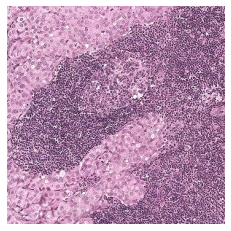

level 3



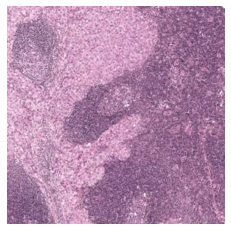

level 4



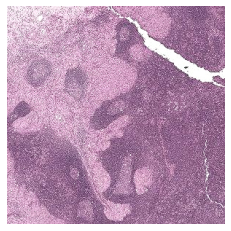

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



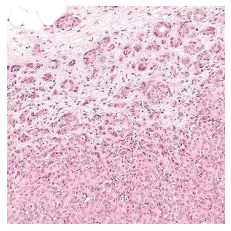

level 3



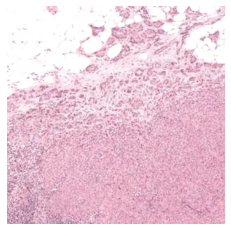

level 4



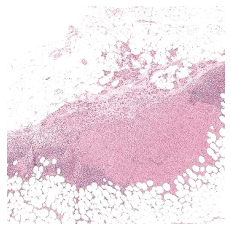

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



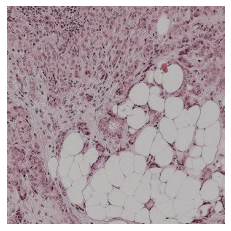

level 3



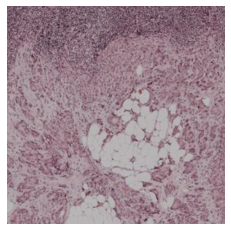

level 4



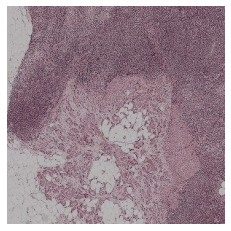

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



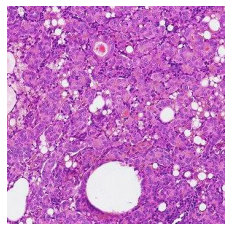

level 3



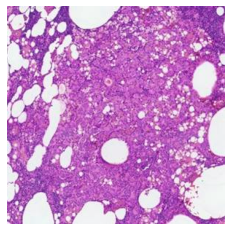

level 4



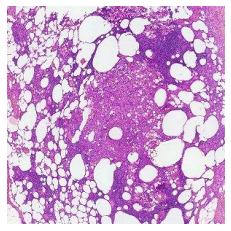

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



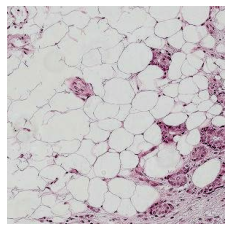

level 3



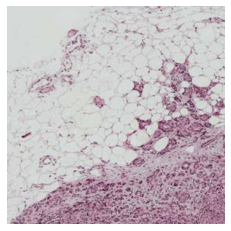

level 4



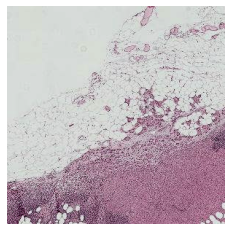

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



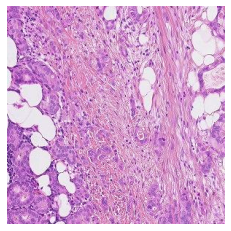

level 3



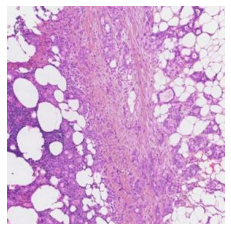

level 4



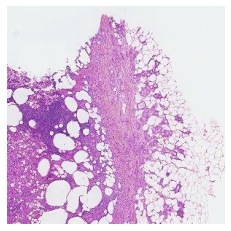

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



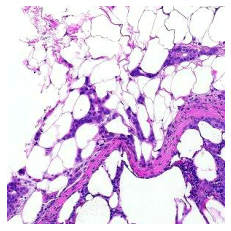

level 3



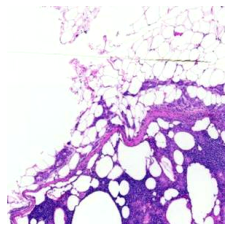

level 4



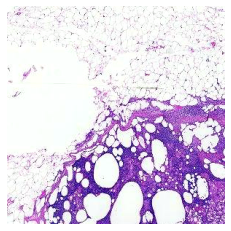

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



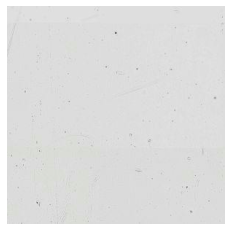

level 3



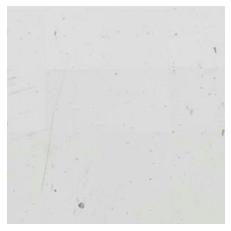

level 4



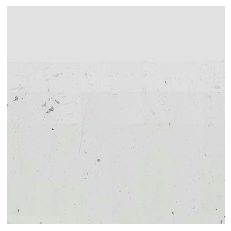

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



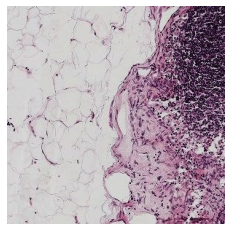

level 3



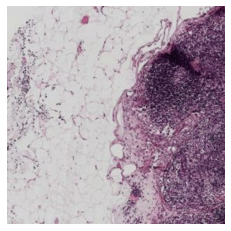

level 4



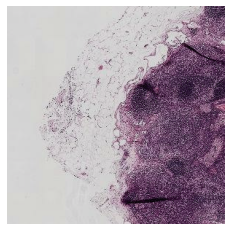

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



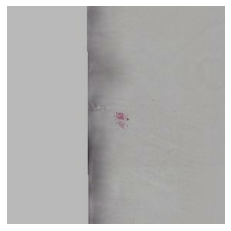

level 3



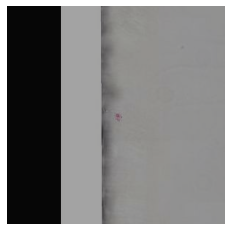

level 4



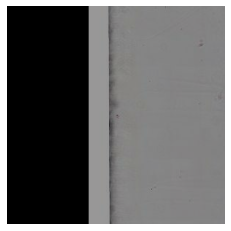

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



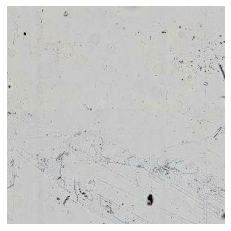

level 3



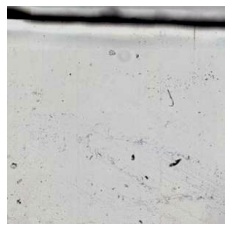

level 4



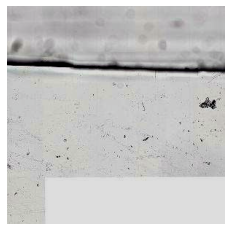

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



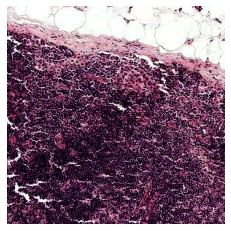

level 3



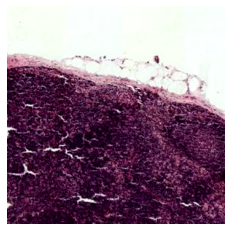

level 4



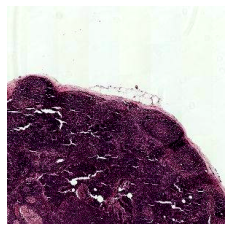

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



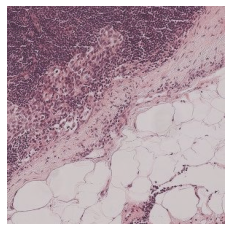

level 3



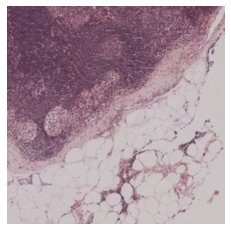

level 4



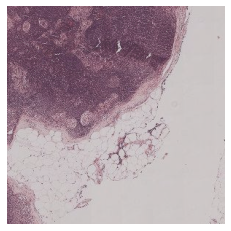

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



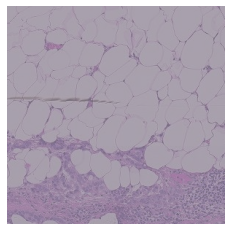

level 3



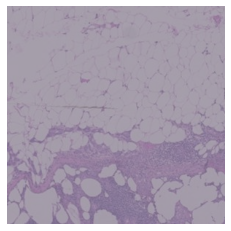

level 4



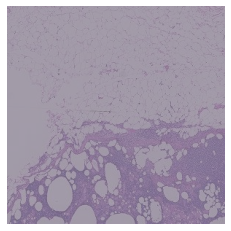

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



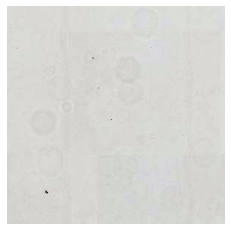

level 3



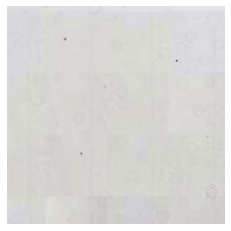

level 4



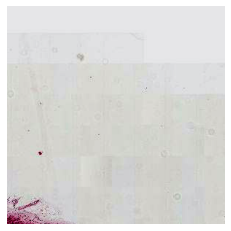

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



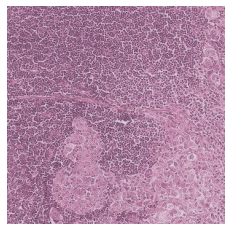

level 3



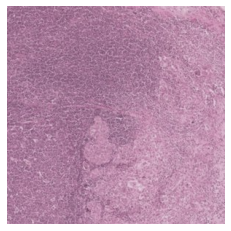

level 4



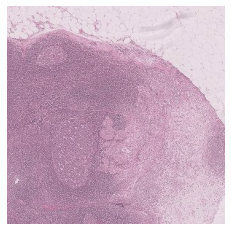

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



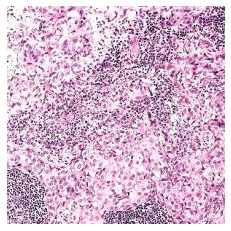

level 3



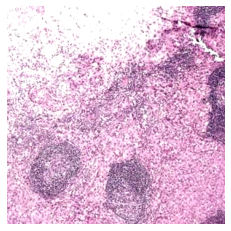

level 4



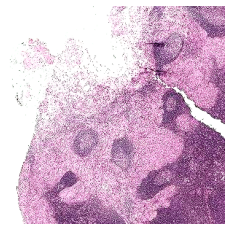

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



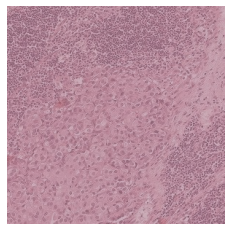

level 3



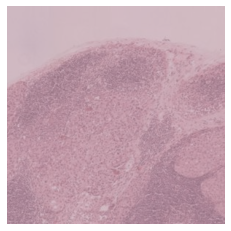

level 4



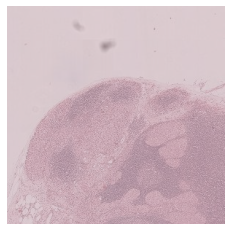

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



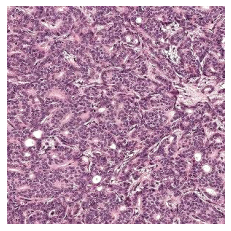

level 3



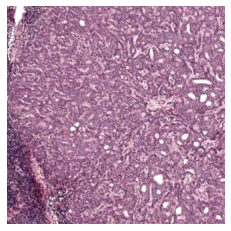

level 4



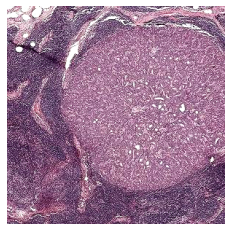

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



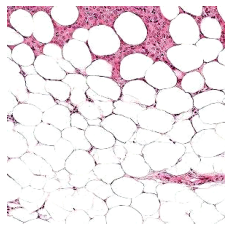

level 3



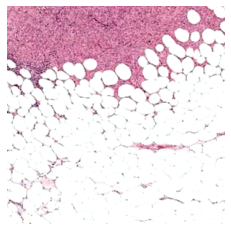

level 4



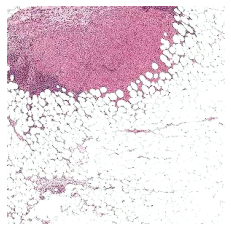

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



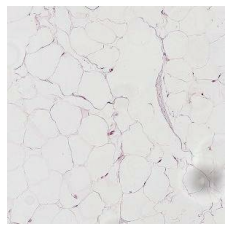

level 3



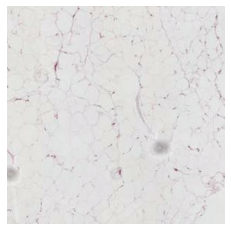

level 4



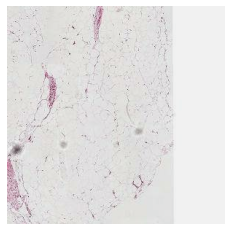

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



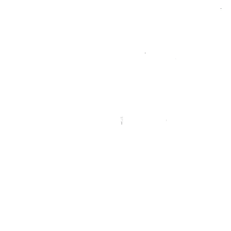

level 3



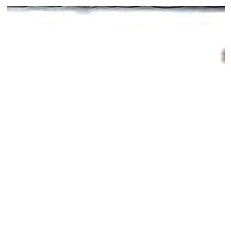

level 4



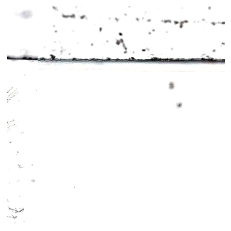

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



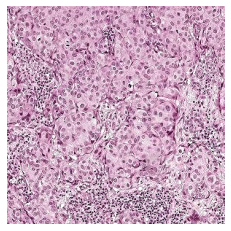

level 3



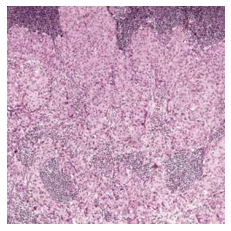

level 4



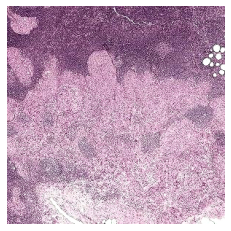

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



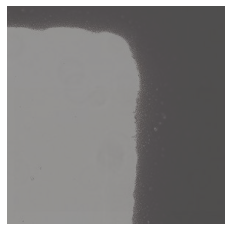

level 3



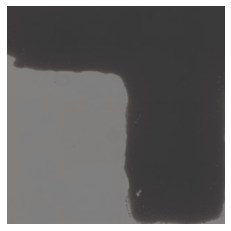

level 4



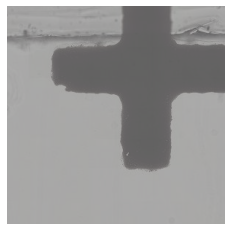

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



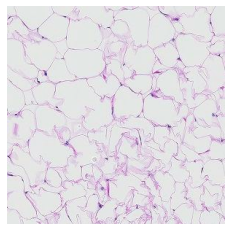

level 3



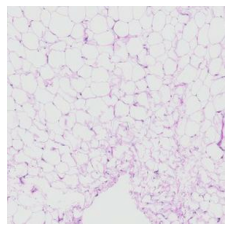

level 4



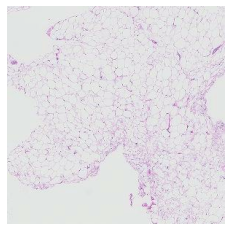

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



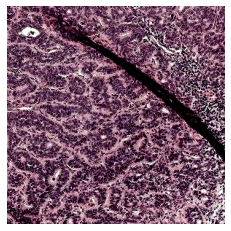

level 3



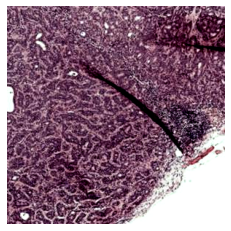

level 4



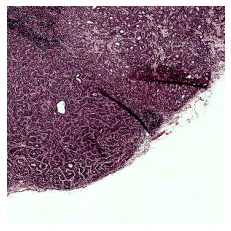

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



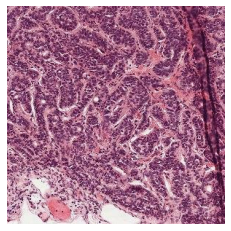

level 3



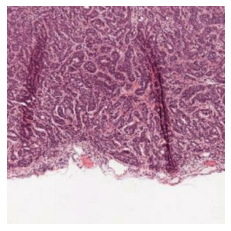

level 4



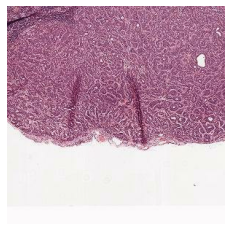

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



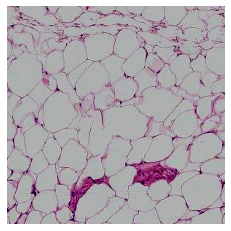

level 3



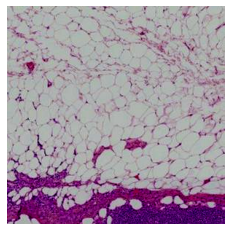

level 4



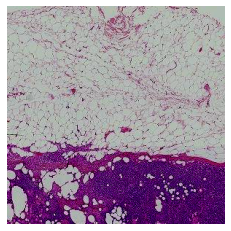

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



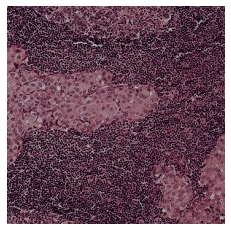

level 3



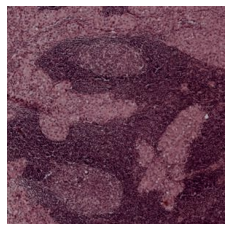

level 4



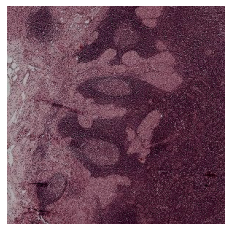

level 5

Label:  tf.Tensor(1.0, shape=(), dtype=float32)



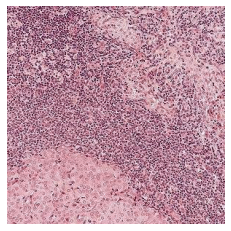

level 3



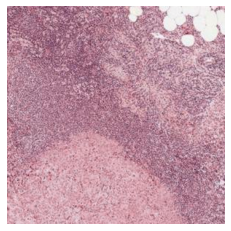

level 4



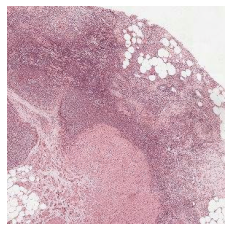

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



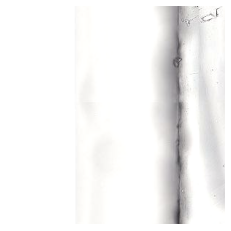

level 3



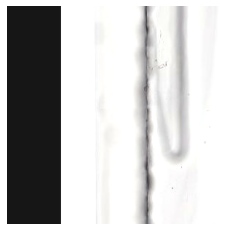

level 4



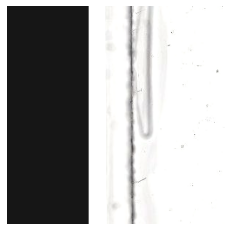

level 5

Label:  tf.Tensor(0.0, shape=(), dtype=float32)



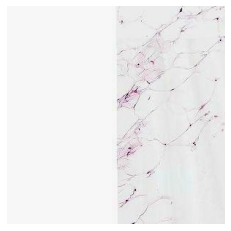

level 3



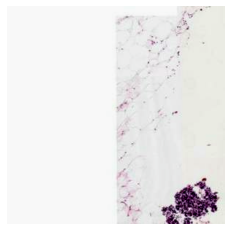

level 4



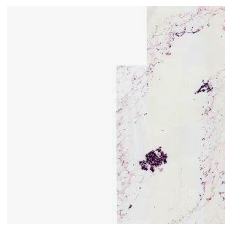

level 5



In [ ]:
for i in range(32):
    print('Label: ', label_batch[i])
    print()
    plt.imshow(image1_batch[i].numpy())
    plt.axis("off")
    plt.show()
    print('level 3')
    print()

    plt.imshow(image2_batch[i].numpy())
    plt.axis("off")
    plt.show()
    print('level 4')
    print()

    plt.imshow(image3_batch[i].numpy())
    plt.axis("off")
    plt.show()
    print('level 5')
    print()

## Train

### Build the model by [Functional API](https://keras.io/getting-started/functional-api-guide/)

In this notebook, I applied InceptionV3 model with pretrained weights on the ImageNet dataset. The InceptionV3 model is not trainable except of the last layer. In *2.2 Multiscale Fine Tune.ipynb* I would unfreeze some top layers to increase model accuracy.

For multiple inputs, apply InceptionV3 model multiple times to each input and concatenate the activations together. Add a final dropout and dense layer at last.

In [ ]:
# input level 3 patch
image1_input = Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='image1')

# import the InceptionV3 base model
base_model = tf.keras.applications.InceptionV3(input_shape=(IMG_SIZE, IMG_SIZE, 3),
                                               include_top=False,
                                                weights='imagenet')
base_model.trainable = False 
image1_activation = base_model(image1_input)
image1_layer = Sequential(name='GlobalAveragePooling1')
image1_layer.add(layers.GlobalAveragePooling2D())
encoded_image1 = image1_layer(image1_activation) 

# input level 4 patch
image2_input = Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='image2')
image2_activation = base_model(image2_input)
image2_layer = Sequential(name='GlobalAveragePooling2')
image2_layer.add(layers.GlobalAveragePooling2D())
encoded_image2 = image2_layer(image2_activation) 

# input level 5 patch
image3_input = Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='image3')
image3_activation = base_model(image3_input)
image3_layer = Sequential(name='GlobalAveragePooling3')
image3_layer.add(layers.GlobalAveragePooling2D())
encoded_image3 = image3_layer(image3_activation) 


merged = layers.concatenate([encoded_image1, encoded_image2, encoded_image3])
merged = layers.Dropout(0.5)(merged)
output = Dense(1, activation='sigmoid')(merged)

model = Model(inputs=[image1_input, image2_input, image3_input], outputs=output)

87916544/87910968 [==============================] - 2s 0us/step


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
image1 (InputLayer)             [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
image2 (InputLayer)             [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
image3 (InputLayer)             [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
inception_v3 (Functional)       (None, 8, 8, 2048)   21802784    image1[0][0]                     
                                                                 image2[0][0]                 

### Define metrics

Although the train data is balanced, our validation and test data are imlalanced and if we only focus on accuracy, it would look nice for any model (always predicting negative gives above 95% accuracy). For imbalanced data, we need different metrics to evaluate model performance.



*   true positives (tp): number of tumor patches correctly classified

*   false positives (fp): number of normal patches classified as tumor

*   true negatives (tn): number of normal patches correctly classified

*   false negatives (fn): number of tumor patches classified as normal

*   accuracy: total rate of correctly classified patches = tn + tp / (p + n)

*   precision: fraction of correctly classified tumor patches among all patches that is classified as tumor

*   recall: fraction of correctly classified tumor patches among all tumor patches

*   auc: Area Under the Curv, measure of the ability of a classifier to distinguish between two classes

*   prc: precision-recall curve

In [ ]:
METRICS = [
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'), 
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc'),
      keras.metrics.AUC(name='prc', curve='PR')# precision-recall curve
]

In [ ]:
model.compile(optimizer='adam', 
              loss='binary_crossentropy',
              metrics=METRICS)

### Plot the model
Show the graph of the model, using [plot_model](https://keras.io/visualization/). This can be helpful to ensure the vision and question paths look at expected.

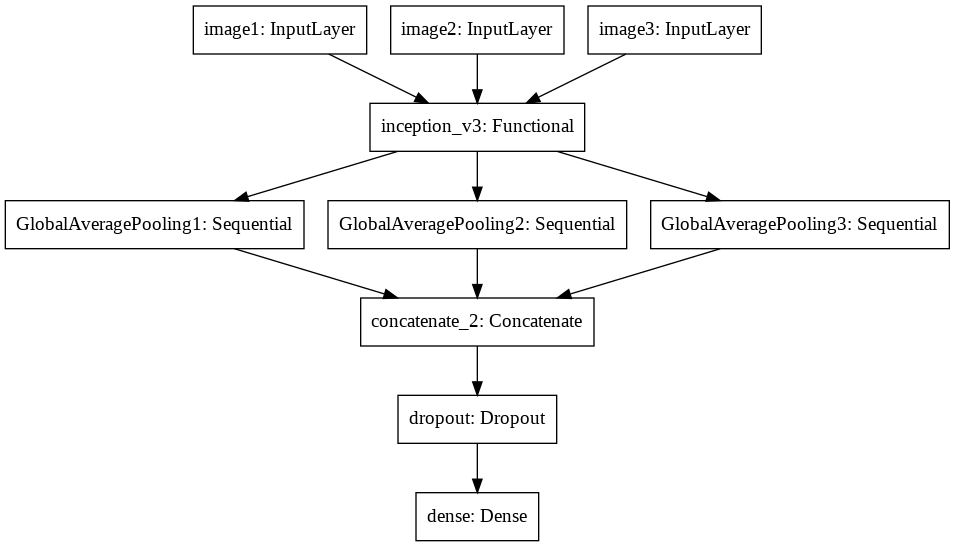

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model.png')

### Sanity check-Train the model on a single batch

Before going on to the next step, check the model works fine by training it repeatly on a single batch. If the model is correct, the training loss should go to zero.

In [ ]:
# function to plot confusion matrix of the model predicton
def plot_cm(pred, label, p=0.5):
    cm = confusion_matrix(label, pred)
    plt.figure(figsize=(5,5))
    sns.heatmap(cm, annot=True, fmt="d")
    plt.title('Confusion matrix @{:.2f}'.format(p))
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')

    print('Legitimate Transactions Detected (True Negatives): ', cm[0][0])
    print('Legitimate Transactions Incorrectly Detected (False Positives): ', cm[0][1])
    print('Fraudulent Transactions Missed (False Negatives): ', cm[1][0])
    print('Fraudulent Transactions Detected (True Positives): ', cm[1][1])
    print('Total Fraudulent Transactions: ', np.sum(cm[1]))

In [ ]:
# function to plot ROC curve of the model predicton
def plot_roc(pred, label):
    fpr, tpr, threshold = roc_curve(label, pred)
    roc_auc = sklearn.metrics.auc(fpr, tpr)

    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

Train on the single batch for 50 epoches.

In [ ]:
metrics_array = []
for i in range(50):
    metrics = model.train_on_batch(x={'image1': image1_batch, 
                                      'image2': image2_batch, 
                                      'image3': image3_batch}, 
                                      y=label_batch)
    metrics_array.append(metrics) 
metrics_array = np.array(metrics_array)

In [ ]:
pred = model.predict(x={'image1': image1_batch, 
                'image2': image2_batch, 
                'image3': image3_batch}).reshape(-1)
pred_batch = np.array([1 if p > 0.5 else 0 for p in pred])

In [ ]:
metrics_name = ['loss', 'tp', 'fp', 'tn', 'fn', 'accuracy', 'precision', 'recall', 'auc', 'prc']

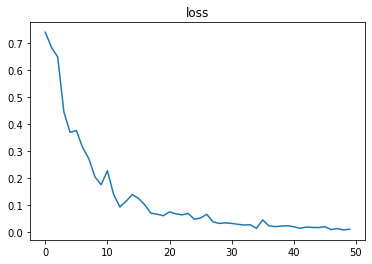

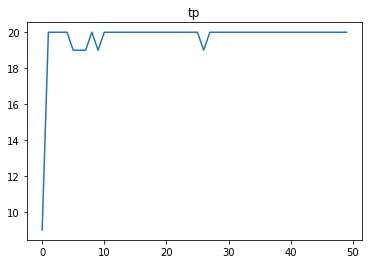

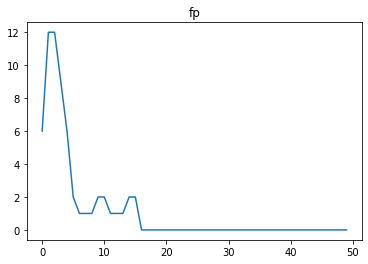

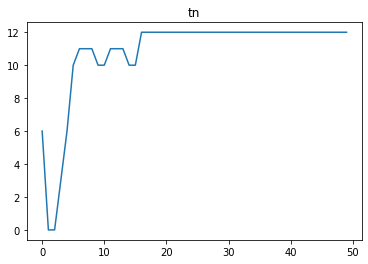

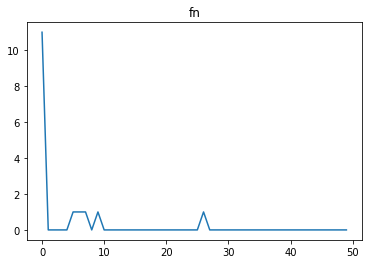

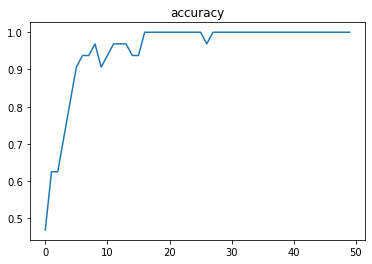

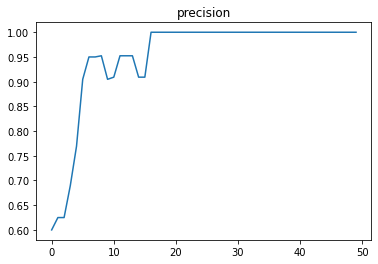

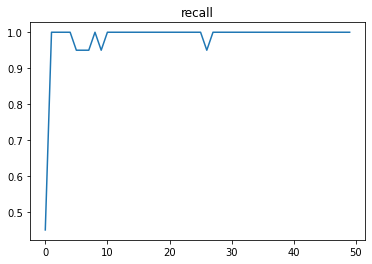

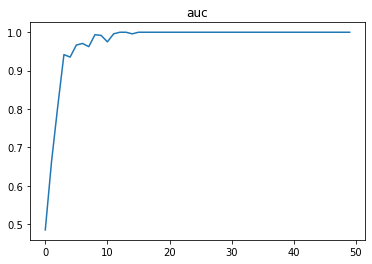

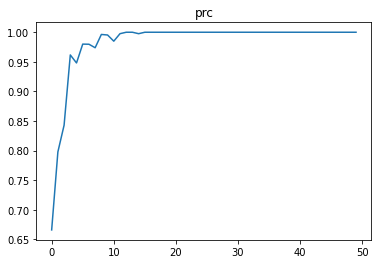

In [ ]:
for i in range(len(metrics_name)):
    plt.plot(metrics_array[:, i])
    plt.title(metrics_name[i])
    plt.show()

Legitimate Transactions Detected (True Negatives):  12
Legitimate Transactions Incorrectly Detected (False Positives):  0
Fraudulent Transactions Missed (False Negatives):  0
Fraudulent Transactions Detected (True Positives):  20
Total Fraudulent Transactions:  20


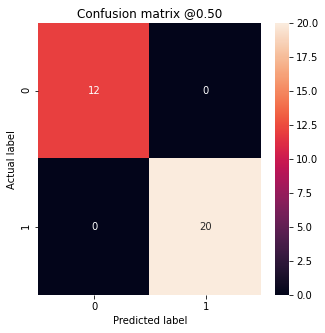

In [ ]:
plot_cm(pred_batch, label_batch)

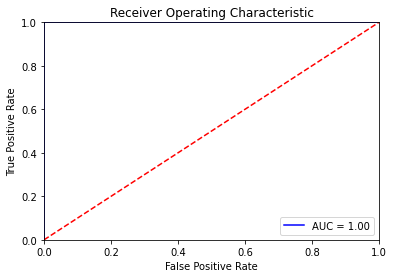

In [ ]:
plot_roc(pred, label_batch)

### Create checkpoints

In [ ]:
checkpoint_dir = os.path.join(drive_root, "checkpoints")
checkpoint_dir = os.path.join(checkpoint_dir, "project")
checkpoint_dir = os.path.join(checkpoint_dir, "Multiscale_inception2")
# Used for formatting
checkpoint_path = os.path.join(checkpoint_dir, "cp-{epoch:08d}.ckpt")

In [ ]:
print("Checkpoints directory is", checkpoint_dir)
if os.path.exists(checkpoint_dir):
  print("Checkpoints folder already exists")
else:
  print("Creating a checkpoints directory")
  os.makedirs(checkpoint_dir)

Checkpoints directory is /gdrive/My Drive/checkpoints/project/Multiscale_inception2
Checkpoints folder already exists


In [ ]:
latest = tf.train.latest_checkpoint(checkpoint_dir)
if latest != None:
  print("Loading weights from", latest)
  model.load_weights(latest)
else:
  print("Checkpoint not found. Starting from scratch")

Loading weights from /gdrive/My Drive/checkpoints/project/Multiscale_inception2/cp-00000014.ckpt


### Create dataset

In [ ]:
train_ds = resampled_ds.shuffle(buffer_size=BUFFER_SIZE).batch(BATCH_SIZE)
val_ds = val_ds.shuffle(buffer_size=BUFFER_SIZE).batch(BATCH_SIZE)

### Utilities to record metrics.

In [ ]:
train_loss = keras.metrics.Mean(name='loss')
train_tp = keras.metrics.TruePositives(name='tp')
train_fp = keras.metrics.FalsePositives(name='fp')
train_tn = keras.metrics.TrueNegatives(name='tn')
train_fn = keras.metrics.FalseNegatives(name='fn')
train_accuracy = keras.metrics.BinaryAccuracy(name='accuracy')
train_precision = keras.metrics.Precision(name='precision')
train_recall = keras.metrics.Recall(name='recall')
train_auc = keras.metrics.AUC(name='auc')
train_prc = keras.metrics.AUC(name='prc', curve='PR')

val_loss = keras.metrics.Mean(name='val_loss')
val_tp = keras.metrics.TruePositives(name='val_tp')
val_fp = keras.metrics.FalsePositives(name='val_fp')
val_tn = keras.metrics.TrueNegatives(name='val_tn')
val_fn = keras.metrics.FalseNegatives(name='val_fn')
val_accuracy = keras.metrics.BinaryAccuracy(name='val_accuracy')
val_precision = keras.metrics.Precision(name='val_precision')
val_recall = keras.metrics.Recall(name='val_recall')
val_auc = keras.metrics.AUC(name='val_auc')
val_prc = keras.metrics.AUC(name='val_prc', curve='PR')

### Code to evaluate on the validation dataset

The validation dataset may be large. It would be wasteful to evaluate on the entire validation dataset each training epoch. Instead, I use the below method to evaluate for a fixed number of steps (batches). This will give a noisier evaluation, but a useful indicator of how the model is doing over time.

In [ ]:
def evaluate(max_steps=None):
  steps = 0
  for image1_batch, image2_batch, image3_batch, label_batch in val_ds:
    if max_steps != None and steps == max_steps:
      break
    predictions = model.predict(x=[image1_batch, image2_batch, image3_batch])
    steps += 1 

    # Record metrics after each batch
    val_loss(label_batch, predictions)
    val_tp(label_batch, predictions)
    val_fp(label_batch, predictions)
    val_tn(label_batch, predictions)
    val_fn(label_batch, predictions)
    val_accuracy(label_batch, predictions)
    val_precision(label_batch, predictions)
    val_recall(label_batch, predictions)
    val_auc(label_batch, predictions)
    val_prc(label_batch, predictions)

### Train model

In [ ]:
# For each epoch, run 200 steps
steps_per_epoch = 200

In [ ]:
train_loss_history = []
train_tp_history = []
train_fp_history = []
train_tn_history = []
train_fn_history = []
train_accuracy_history = []
train_precision_history = []
train_recall_history = []
train_auc_history = []
train_prc_history = []

val_loss_history = []
val_tp_history = []
val_fp_history = []
val_tn_history = []
val_fn_history = []
val_accuracy_history = []
val_precision_history = []
val_recall_history = []
val_auc_history = []
val_prc_history = []

epochs = 15

# Training loop
for epoch in range(epochs):

    start = time.time()

    # Train for one epoch
    step = 0
    for image1_batch, image2_batch, image3_batch, label_batch in train_ds:
        if step == steps_per_epoch:
            break
        step += 1
        if step % 50 == 0:
            print('step ', step, ': train auc: ', train_auc.result())
        result = model.train_on_batch(x=[image1_batch, image2_batch, image3_batch], y=label_batch)
        predictions = model.predict(x=[image1_batch, image2_batch, image3_batch])
        # Record metrics after each batch
        train_loss(label_batch, predictions)
        train_tp(label_batch, predictions)
        train_fp(label_batch, predictions)
        train_tn(label_batch, predictions)
        train_fn(label_batch, predictions)
        train_accuracy(label_batch, predictions)
        train_precision(label_batch, predictions)
        train_recall(label_batch, predictions)
        train_auc(label_batch, predictions)
        train_prc(label_batch, predictions)

    # Evaluate for a few steps
    evaluate(max_steps=100)

    # Print progress
    template = 'Epoch {}, Auc: {:.2f}, Precision: {:.2f}, Recall: {:.2f}, Val Auc: {:.2f}, Val Precision: {:.2f}, Val Recall: {:.2f}, Time: {:.1f} secs'
    print(template.format(epoch,
                        train_auc.result(),
                        train_precision.result(),
                        train_recall.result(),
                        val_auc.result(),
                        val_precision.result(),
                        val_recall.result(),
                        time.time() - start))

    train_loss_history.append(train_loss.result())
    train_tp_history.append(train_tp.result())
    train_fp_history.append(train_fp.result())
    train_tn_history.append(train_tn.result())
    train_fn_history.append(train_fn.result())
    train_accuracy_history.append(train_accuracy.result())
    train_precision_history.append(train_precision.result())
    train_recall_history.append(train_recall.result())
    train_auc_history.append(train_auc.result())
    train_prc_history.append(train_prc.result())

    val_loss_history.append(val_loss.result())
    val_tp_history.append(val_tp.result())
    val_fp_history.append(val_fp.result())
    val_tn_history.append(val_tn.result())
    val_fn_history.append(val_fn.result())
    val_accuracy_history.append(val_accuracy.result())
    val_precision_history.append(val_precision.result())
    val_recall_history.append(val_recall.result())
    val_auc_history.append(val_auc.result())
    val_prc_history.append(val_prc.result())

    # reset metrics
    train_loss.reset_states()
    train_tp.reset_states()
    train_fp.reset_states()
    train_tn.reset_states()
    train_fn.reset_states()
    train_accuracy.reset_states()
    train_precision.reset_states()
    train_recall.reset_states()
    train_auc.reset_states()
    train_prc.reset_states()

    val_loss.reset_states()
    val_tp.reset_states()
    val_fp.reset_states()
    val_tn.reset_states()
    val_fn.reset_states()
    val_accuracy.reset_states()
    val_precision.reset_states()
    val_recall.reset_states()
    val_auc.reset_states()
    val_prc.reset_states()


    # Save a checkpoint after each epoch
    print("Saving weights")
    model.save_weights(pathlib.Path(checkpoint_path.format(epoch=epoch)))

step  50 : train auc:  tf.Tensor(0.95728934, shape=(), dtype=float32)
step  100 : train auc:  tf.Tensor(0.97172046, shape=(), dtype=float32)
step  150 : train auc:  tf.Tensor(0.97566634, shape=(), dtype=float32)
step  200 : train auc:  tf.Tensor(0.9797359, shape=(), dtype=float32)
Epoch 0, Auc: 0.98, Precision: 0.91, Recall: 0.95, Val Auc: 0.92, Val Precision: 0.39, Val Recall: 0.94, Time: 346.2 secs
Saving weights
step  50 : train auc:  tf.Tensor(0.99225724, shape=(), dtype=float32)
step  100 : train auc:  tf.Tensor(0.9914825, shape=(), dtype=float32)
step  150 : train auc:  tf.Tensor(0.9920915, shape=(), dtype=float32)
step  200 : train auc:  tf.Tensor(0.9917051, shape=(), dtype=float32)
Epoch 1, Auc: 0.99, Precision: 0.94, Recall: 0.97, Val Auc: 0.92, Val Precision: 0.41, Val Recall: 0.92, Time: 323.2 secs
Saving weights
step  50 : train auc:  tf.Tensor(0.99359834, shape=(), dtype=float32)
step  100 : train auc:  tf.Tensor(0.9937678, shape=(), dtype=float32)
step  150 : train auc:  

### Evaluate on the validation set

In [ ]:
val_loss.reset_states()
val_tp.reset_states()
val_fp.reset_states()
val_tn.reset_states()
val_fn.reset_states()
val_accuracy.reset_states()
val_precision.reset_states()
val_recall.reset_states()
val_auc.reset_states()
val_prc.reset_states()

In [ ]:
evaluate()

In [ ]:
print('val_loss: ', val_loss.result().numpy())
print('val_tp', val_tp.result().numpy())
print('val_fp: ', val_fp.result().numpy())
print('val_tn: ', val_tn.result().numpy())
print('val_fn', val_fn.result().numpy())
print('val_accuracy: ', val_accuracy.result().numpy())
print('val_precision', val_precision.result().numpy())
print('val_recall: ', val_recall.result().numpy())
print('val_auc', val_auc.result().numpy())
print('val_prc', val_prc.result().numpy())

val_loss:  0.37595454
val_tp 1335.0
val_fp:  1794.0
val_tn:  16235.0
val_fn 242.0
val_accuracy:  0.89618397
val_precision 0.4266539
val_recall:  0.8465441
val_auc 0.95216924
val_prc 0.70673233


### Evaluate on the test set

In [ ]:
test_ds = test_ds.shuffle(buffer_size=BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
predictions = []
truths = []
for image1_batch, image2_batch, image3_batch, label_batch in test_ds:
    predictions += list(model.predict(x=[image1_batch, image2_batch, image3_batch]))
    truths += list(label_batch.numpy())

In [ ]:
predictions = np.array(predictions).reshape(-1)

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score

In [ ]:
pred_bool = np.array([1 if p > 0.5 else 0 for p in predictions])

In [ ]:
print('test precision: ', precision_score(truths, pred_bool))
print('test recall: ', recall_score(truths, pred_bool))
print('test f1: ', f1_score(truths, pred_bool))
print('test auc: ', roc_auc_score(truths, predictions))

test precision:  0.2799776910206358
test recall:  0.8796728971962616
test f1:  0.42476378507967844
test auc:  0.9215463268646126


#### Confusion matrix

Legitimate Transactions Detected (True Negatives):  18021
Legitimate Transactions Incorrectly Detected (False Positives):  3873
Fraudulent Transactions Missed (False Negatives):  206
Fraudulent Transactions Detected (True Positives):  1506
Total Fraudulent Transactions:  1712


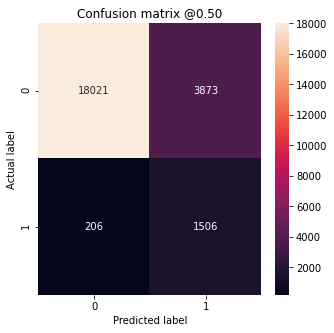

In [ ]:
plot_cm(pred_bool, truths)

#### ROC curve

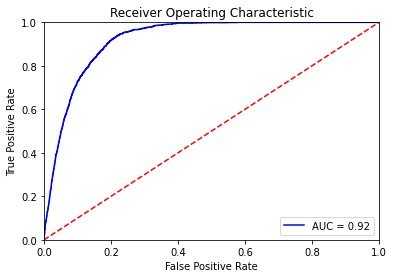

In [ ]:
plot_roc(predictions, truths)

### Plot heatmaps

The ROC curve shows that the model is performing fine on the test set. Note that we are making predictions on the patches extracted from the original slide image. Our goal is to make predictions on the slide, that is, to tell which region contains tumor cell. To show how it could find out tumor regions, I pick out three tumor slide in the test set-No.094, No.101, No.110 to make inference on the images.

To make inference, I write a function to slide a window across the image and call the model each time to make predictions. Iteration through the whole image gives me a 2d matrix which is the heatmap of model predictions.

In [ ]:
def download_slide(slide_name):
    data_dir = 'https://storage.googleapis.com/slices-xh2465/'
    slide_url = data_dir + slide_name + '.tif'
    mask_url = data_dir + slide_name + '_mask.tif'
    !curl -O $slide_url
    !curl -O $mask_url
    slide_path = slide_name + '.tif'
    tumor_mask_path = slide_name + '_mask.tif'
    return slide_path, tumor_mask_path

In [ ]:
# Show the slide image and its tumor mask
def diplay_whole_slide(slide, tumor_mask, level=5):
    slide_image = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=level, 
                         width=slide.level_dimensions[level][0], 
                         height=slide.level_dimensions[level][1])
    mask_image = read_slide(tumor_mask, 
                        x=0, 
                        y=0, 
                        level=level, 
                        width=slide.level_dimensions[level][0], 
                        height=slide.level_dimensions[level][1])
    mask_image = mask_image[:,:,0]
    # Overlay them. The idea is that the mask shows the region of the slide that
    # contain cancerous cells.
    plt.figure(figsize=(10,10), dpi=100)
    plt.imshow(slide_image)
    plt.imshow(mask_image, cmap='jet', alpha=0.5) # Red regions contains cancer.
    plt.show()

In [ ]:
patch_size = 299
center_size = 128
stride = 128

In [ ]:
def preprocess_image(img):
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])  # resize
    img /= 255.0  # normalize pixels to 0,1
    return img

In [ ]:
def output_heatmap(slide, model, level=3, x=0, y=0, width=None, height=None):
    if width is None and height is None:
        width, height = slide.level_dimensions[level]
    i, j = x, y
    downsample = 2**level
    heatmap = []
    while j <= y + height - patch_size:
        heatmap.append([])
        while i <= x + width - patch_size:
            center_image = read_slide(slide, 
                                    x=(i+(patch_size-center_size)//2+1) * downsample, 
                                    y=(j+(patch_size-center_size)//2+1) * downsample, 
                                    level=level, 
                                    width=center_size, 
                                    height=center_size)
            if len(find_tissue_pixels(center_image)) == 0:
                i += stride
                heatmap[-1].append(0.0)
                continue
            patch_image1 = read_slide(slide, 
                                    x=i * downsample, 
                                    y=j * downsample, 
                                    level=level, 
                                    width=patch_size, 
                                    height=patch_size)
            
            patch_image2 = read_slide(slide, 
                                    x=(i-(patch_size//2)) * downsample, 
                                    y=(j-(patch_size//2)) * downsample, 
                                    level=level+1, 
                                    width=patch_size, 
                                    height=patch_size)
            patch_image3 = read_slide(slide, 
                                    x=(i-(3*patch_size//2)) * downsample, 
                                    y=(j-(3*patch_size//2)) * downsample, 
                                    level=level+2, 
                                    width=patch_size, 
                                    height=patch_size)
            
            img1 = preprocess_image(patch_image1)
            img2 = preprocess_image(patch_image2)
            img3 = preprocess_image(patch_image3)
            batch_pred = model.predict(x=[tf.expand_dims(img1, axis=0), tf.expand_dims(img2, axis=0), tf.expand_dims(img3, axis=0)])
            pred = batch_pred[0][0]
            heatmap[-1].append(pred)
            i += stride
        i = x
        j += stride
    return heatmap

#### Example - tumor_101

In [ ]:
slide_path, tumor_mask_path = download_slide('tumor_101')
slide = open_slide(slide_path)
tumor_mask = open_slide(tumor_mask_path)

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1392M  100 1392M    0     0  29.9M      0  0:00:46  0:00:46 --:--:-- 39.4M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 43.9M  100 43.9M    0     0  23.2M      0  0:00:01  0:00:01 --:--:-- 23.2M


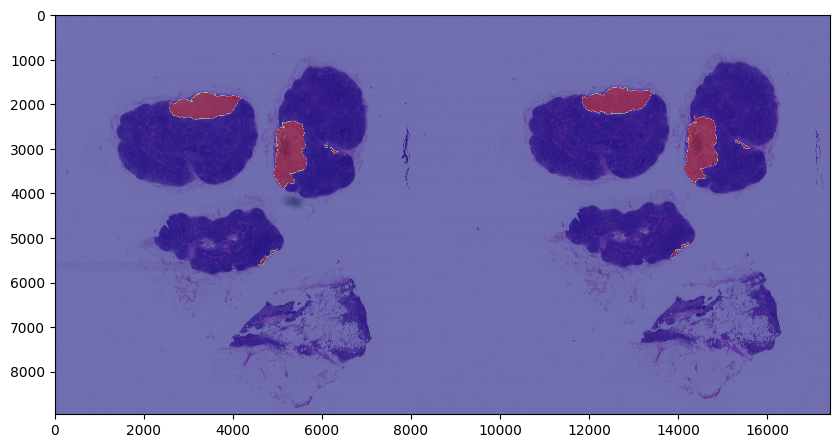

In [ ]:
diplay_whole_slide(slide, tumor_mask, level=3)

In [ ]:
x, y, width, height = 1000, 1000, 6000, 6000

In [ ]:
patch = read_slide(slide, x=x * 8, y=y * 8, level=3, width=width, height=height)

In [ ]:
region = read_slide(tumor_mask, x=x * 8, y=y * 8, level=3, width=width, height=height)[:,:,0]

Plot the slide and mask

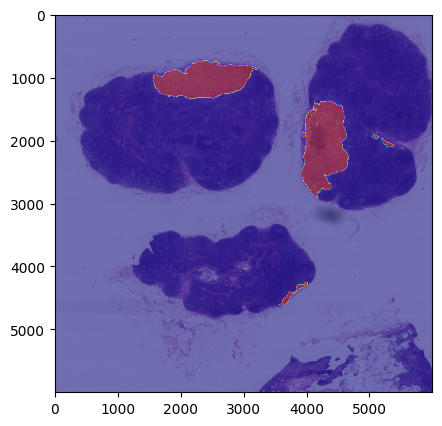

In [ ]:
plt.figure(figsize=(5,5), dpi=100)
plt.imshow(patch)
plt.imshow(region, cmap='jet', alpha=0.5) # Red regions contains cancer.

In [ ]:
heatmap = output_heatmap(slide, model, 3, x, y, width, height)

Plot the heatmap

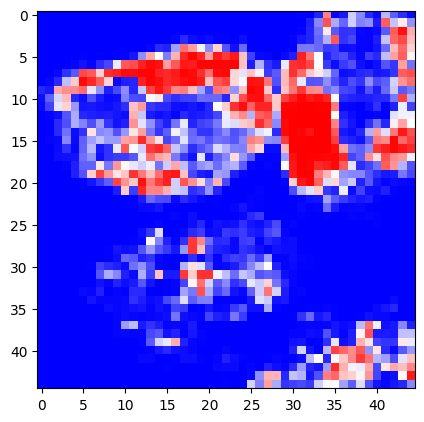

In [ ]:
plt.figure(figsize=(5,5), dpi=100)
plt.imshow(heatmap, cmap='bwr', vmin=0, vmax=1)
plt.show()

#### Example - tumor_110

In [ ]:
slide_path, tumor_mask_path = download_slide('tumor_110')

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1416M  100 1416M    0     0  48.6M      0  0:00:29  0:00:29 --:--:-- 52.2M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 31.3M  100 31.3M    0     0  13.9M      0  0:00:02  0:00:02 --:--:-- 13.9M


In [ ]:
slide = open_slide(slide_path)
tumor_mask = open_slide(tumor_mask_path)

In [ ]:
slide.level_dimensions[3]

(11776, 8960)

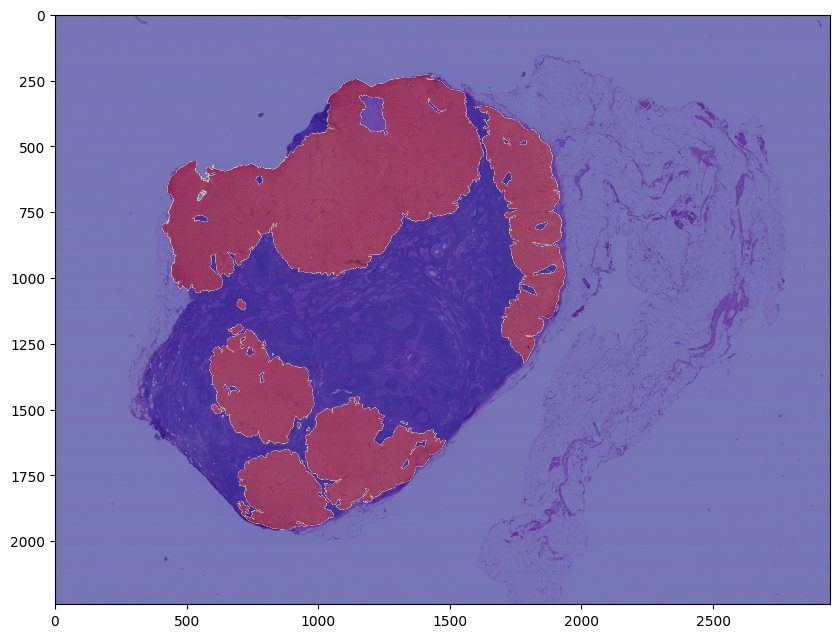

In [ ]:
diplay_whole_slide(slide, tumor_mask)

In [ ]:
region = read_slide(tumor_mask, x=x * 8, y=y * 8, level=3, width=width, height=height)[:,:,0]

In [ ]:
patch = read_slide(slide, x=x * 8, y=y * 8, level=3, width=width, height=height)

In [ ]:
x, y, width, height = 0, 0, 10000, 8000

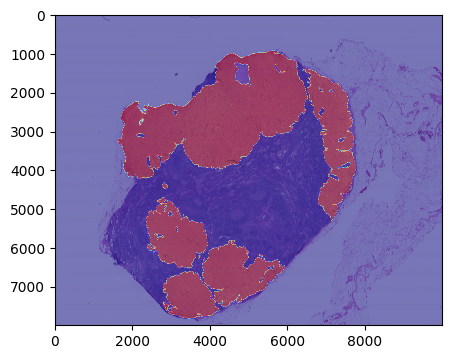

In [ ]:
plt.figure(figsize=(5,5), dpi=100)
plt.imshow(patch)
plt.imshow(region, cmap='jet', alpha=0.5) # Red regions contains cancer.

In [ ]:
heatmap = output_heatmap(slide, model, 3, x, y, width, height)

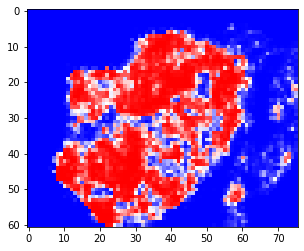

In [ ]:
plt.imshow(heatmap, cmap='bwr', vmin=0, vmax=1)
plt.show()

#### Example - tumor_094

In [ ]:
slide_path, tumor_mask_path = download_slide('tumor_094')
slide = open_slide(slide_path)
tumor_mask = open_slide(tumor_mask_path)

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1534M  100 1534M    0     0  65.4M      0  0:00:23  0:00:23 --:--:-- 83.3M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 51.7M  100 51.7M    0     0  14.0M      0  0:00:03  0:00:03 --:--:-- 14.0M


In [ ]:
slide.level_dimensions[3]

(14848, 12544)

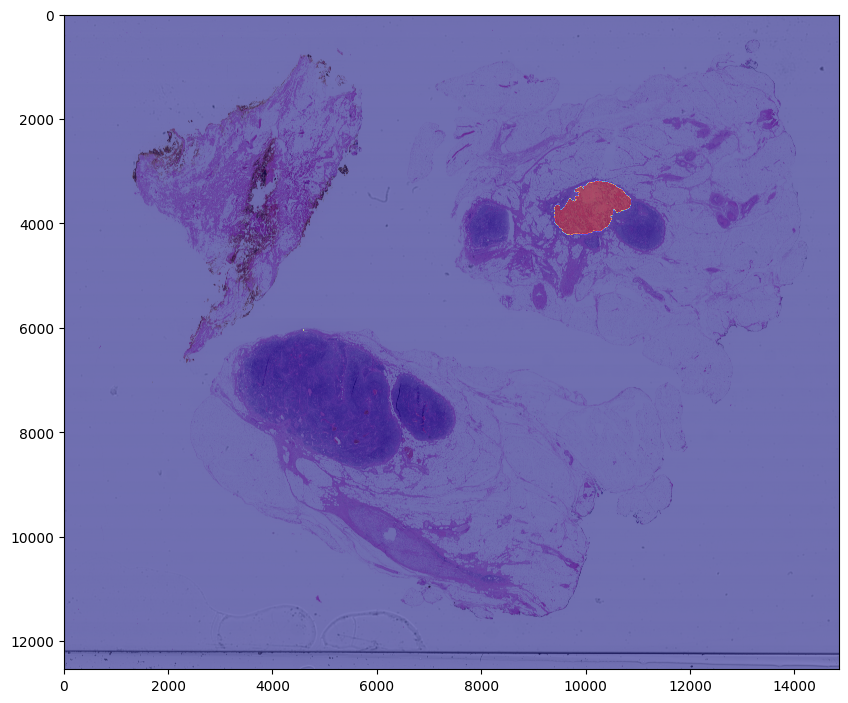

In [ ]:
diplay_whole_slide(slide, tumor_mask, level=3)

In [ ]:
x, y, width, height = 8000, 3000, 4000, 4000

In [ ]:
patch = read_slide(slide, x=x * 8, y=y * 8, level=3, width=width, height=height)

In [ ]:
region = read_slide(tumor_mask, x=x * 8, y=y * 8, level=3, width=width, height=height)[:,:,0]

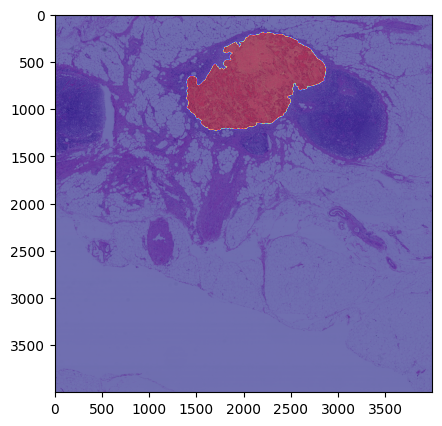

In [ ]:
plt.figure(figsize=(5,5), dpi=100)
plt.imshow(patch)
plt.imshow(region, cmap='jet', alpha=0.5) # Red regions contains cancer.

In [ ]:
heatmap = output_heatmap(slide, model, 3, x, y, width, height)

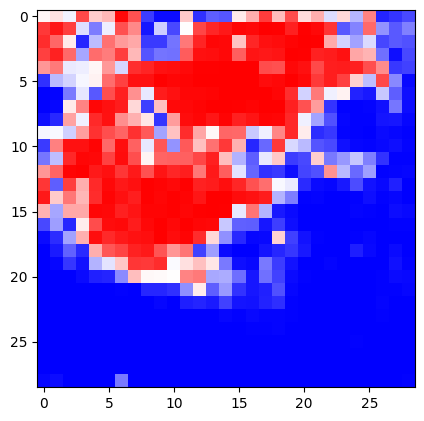

In [ ]:
plt.figure(figsize=(5,5), dpi=100)
plt.imshow(heatmap, cmap='bwr', vmin=0, vmax=1)
plt.show()